## Homework 2

### Due Date: 10-16-2024

#### Alejandro Roa Contreras

For this assignment, you will practice downloadings, cleaning, and analyzing data from the [National Risk Index (NRI)](https://hazards.fema.gov/nri/) and the [CDC Social Vulnerability Index (SVI)](https://www.atsdr.cdc.gov/placeandhealth/svi/index.html).


#### Preparation

1. Create a 'data' folder in the root directory of your repository.
1. Inside the 'data' folder, create a 'raw' folder.
1. Add and commit a '.gitignore' file to the root directory of this repository that excludes all contents of the 'data' folder.
1. Download the county-level NRI and SVI data for the entire United States. Place the data in the 'data/raw' folder.
1. In the repository README, provide a brief (1-2 sentence) description of each file in the 'data' folder and a link to the original source of the data.


#### Task 1 - NRI Data Cleaning

1. Import the NRI data. Ensure that the [FIPS code](https://en.wikipedia.org/wiki/Federal_Information_Processing_Standard_state_code) variable ('STCOFIPS') is correctly identified as a string / character variable. Otherwise, the leading zeros will be removed.

In [55]:
import pandas as pd

In [56]:
NRI_data = pd.read_csv('/Users/alejandroroacontreras/Library/CloudStorage/GoogleDrive-alejandro.roa.cs@gmail.com/Mi unidad/Pardee Rand Graduate School/Year 2/Introduction to ML/code/PRGS-Intro-to-ML-2024/data/raw/NRI_counties_level.csv', dtype={'STCOFIPS':str})

In [57]:
NRI_data.head()

,OID_,NRI_ID,STATE,STATEABBRV,STATEFIPS,COUNTY,COUNTYTYPE,COUNTYFIPS,STCOFIPS,POPULATION,...,WNTW_EALS,WNTW_EALR,WNTW_ALRB,WNTW_ALRP,WNTW_ALRA,WNTW_ALR_NPCTL,WNTW_RISKV,WNTW_RISKS,WNTW_RISKR,NRI_VER
0,1,C01001,Alabama,AL,1,Autauga,County,1,01001,58764,...,15.784587,Very Low,2.687716e-07,7.410082e-09,8.725777e-06,10.461158,8494.906508,12.217626,Very Low,March 2023
1,2,C01003,Alabama,AL,1,Baldwin,County,3,01003,231365,...,56.205509,Relatively Moderate,1.268231e-09,2.287120e-08,1.548360e-07,13.339523,65619.701638,52.083996,Relatively Low,March 2023
2,3,C01005,Alabama,AL,1,Barbour,County,5,01005,25160,...,18.632002,Relatively Low,5.788050e-07,2.347236e-08,7.606598e-07,16.125039,15501.730335,19.535476,Very Low,March 2023
3,4,C01007,Alabama,AL,1,Bibb,County,7,01007,22239,...,13.308573,Very Low,9.014679e-07,1.270300e-08,1.202015e-05,16.991643,7496.186940,11.104041,Very Low,March 2023
4,5,C01009,Alabama,AL,1,Blount,County,9,01009,58992,...,23.645930,Relatively Low,5.268425e-07,1.482016e-08,2.002965e-07,12.039616,17175.160729,21.444480,Very Low,March 2023


In [58]:
print(NRI_data['STCOFIPS'].dtype)


object


2. Subset the NRI data to include only the 5-digit state/county FIPS code and all colums ending with '\_AFREQ' and '\_RISKR'. Each of these columns represents a different hazard type.

In [59]:
NRI_data.shape

(3231, 465)

In [60]:
STCOFIPS_column = 'STCOFIPS'

In [61]:
columns_selection = [STCOFIPS_column] + [col for col in NRI_data.columns if col.endswith('_AFREQ') or col.endswith('_RISKR')]

In [62]:
subset_NRI = NRI_data[columns_selection]

In [63]:
subset_NRI.head()

,STCOFIPS,AVLN_AFREQ,AVLN_RISKR,CFLD_AFREQ,CFLD_RISKR,CWAV_AFREQ,CWAV_RISKR,DRGT_AFREQ,DRGT_RISKR,ERQK_AFREQ,...,TRND_AFREQ,TRND_RISKR,TSUN_AFREQ,TSUN_RISKR,VLCN_AFREQ,VLCN_RISKR,WFIR_AFREQ,WFIR_RISKR,WNTW_AFREQ,WNTW_RISKR
0,01001,NaN,Not Applicable,NaN,Not Applicable,0.0,No Rating,25.969774,Relatively Low,0.000431,...,0.480184,Relatively Moderate,NaN,Not Applicable,NaN,Not Applicable,0.000035,Very Low,0.433437,Very Low
1,01003,NaN,Not Applicable,3.684142,Relatively Low,0.0,No Rating,12.353442,Relatively Moderate,0.000338,...,0.953140,Relatively Moderate,NaN,Insufficient Data,NaN,Not Applicable,0.002229,Relatively Moderate,0.182759,Relatively Low
2,01005,NaN,Not Applicable,NaN,Not Applicable,0.0,No Rating,43.956953,Relatively Low,0.000227,...,0.739018,Relatively Moderate,NaN,Not Applicable,NaN,Not Applicable,0.000038,Very Low,0.185759,Very Low
3,01007,NaN,Not Applicable,NaN,Not Applicable,0.0,No Rating,28.894501,Very Low,0.000790,...,0.586160,Relatively Moderate,NaN,Not Applicable,NaN,Not Applicable,0.000040,Very Low,0.743034,Very Low
4,01009,NaN,Not Applicable,NaN,Not Applicable,0.0,No Rating,28.152598,Relatively Low,0.000817,...,0.710332,Relatively Moderate,NaN,Not Applicable,NaN,Not Applicable,0.000035,Very Low,0.866873,Very Low


3. Create a table / dataframe that, for each hazard type, shows the number of missing values in the '\_AFREQ' and '\_RISKR' columns

In [64]:
missing_values= subset_NRI.isnull().sum().sort_values(ascending=False)

In [65]:
afreq_missing = []
riskr_missing = []

In [66]:
for col in missing_values.index:
    if col.endswith('_AFREQ'):
        afreq_missing.append({'Column': col, 'Missing_Count': missing_values[col]})
    elif col.endswith('_RISKR'):
        riskr_missing.append({'Column': col, 'Missing_Count': missing_values[col]})

In [67]:
afreq_df = pd.DataFrame(afreq_missing)
riskr_df = pd.DataFrame(riskr_missing)

In [68]:
afreq_df['Hazard_Type'] = afreq_df['Column'].str.replace('_AFREQ', '', regex=False)
riskr_df['Hazard_Type'] = riskr_df['Column'].str.replace('_RISKR', '', regex=False)


In [69]:
final_table = pd.merge(afreq_df[['Hazard_Type', 'Missing_Count']], 
                    riskr_df[['Hazard_Type', 'Missing_Count']], 
                    on='Hazard_Type', suffixes=('_AFREQ', '_RISKR'))

In [70]:
final_table = pd.merge(afreq_df[['Hazard_Type', 'Missing_Count']], 
                    riskr_df[['Hazard_Type', 'Missing_Count']], 
                    on='Hazard_Type', suffixes=('_AFREQ', '_RISKR'))

In [71]:
final_table

,Hazard_Type,Missing_Count_AFREQ,Missing_Count_RISKR
0,VLCN,3125,0
1,TSUN,3103,0
2,AVLN,3023,0
3,CFLD,2646,0
4,HRCN,918,0
5,ISTM,229,0
6,LTNG,123,0
7,WFIR,88,0
8,LNDS,40,0
9,TRND,7,0


4. Create a new column in the original data table indicating whether or not 'AVLN_AFREQ' is missing or observed. Show the cross-tabulation of the 'AVLN_AFREQ' missingness and 'AVLN_RISKR' columns (including missing values). What do you observe?

In [72]:
NRI_data['AVLN_AFREQ_Missing'] = NRI_data['AVLN_AFREQ'].isnull()

In [73]:
cross_tab = pd.crosstab(NRI_data['AVLN_AFREQ_Missing'], NRI_data['AVLN_RISKR'], dropna=False)


In [74]:
cross_tab

AVLN_RISKR,Not Applicable,Relatively High,Relatively Low,Relatively Moderate,Very High,Very Low
AVLN_AFREQ_Missing,,,,,,
False,0,15,52,33,9,99
True,3023,0,0,0,0,0


For rows where AVLN_AFREQ is missing True, all corresponding values in AVLN_RISKR are Not Applicable. Therefore, the missing values in AVLN_AFREQ might be linked to certain risk categories. 

5. Assuming that a risk that is "not applicable" to a county has an annualized frequency of 0, impute the relevant missing values in the '\_AFREQ' columns with 0.

In [75]:
afreq_columns = [col for col in subset_NRI.columns if col.endswith('_AFREQ')]
for afreq_col in afreq_columns:
    riskr_col = afreq_col.replace('_AFREQ', '_RISKR')
    if riskr_col in subset_NRI.columns:
        subset_NRI.loc[subset_NRI[riskr_col] == 'Not Applicable', afreq_col] = subset_NRI[afreq_col].fillna(0)

In [76]:
subset_NRI.head()


,STCOFIPS,AVLN_AFREQ,AVLN_RISKR,CFLD_AFREQ,CFLD_RISKR,CWAV_AFREQ,CWAV_RISKR,DRGT_AFREQ,DRGT_RISKR,ERQK_AFREQ,...,TRND_AFREQ,TRND_RISKR,TSUN_AFREQ,TSUN_RISKR,VLCN_AFREQ,VLCN_RISKR,WFIR_AFREQ,WFIR_RISKR,WNTW_AFREQ,WNTW_RISKR
0,01001,0.0,Not Applicable,0.000000,Not Applicable,0.0,No Rating,25.969774,Relatively Low,0.000431,...,0.480184,Relatively Moderate,0.0,Not Applicable,0.0,Not Applicable,0.000035,Very Low,0.433437,Very Low
1,01003,0.0,Not Applicable,3.684142,Relatively Low,0.0,No Rating,12.353442,Relatively Moderate,0.000338,...,0.953140,Relatively Moderate,NaN,Insufficient Data,0.0,Not Applicable,0.002229,Relatively Moderate,0.182759,Relatively Low
2,01005,0.0,Not Applicable,0.000000,Not Applicable,0.0,No Rating,43.956953,Relatively Low,0.000227,...,0.739018,Relatively Moderate,0.0,Not Applicable,0.0,Not Applicable,0.000038,Very Low,0.185759,Very Low
3,01007,0.0,Not Applicable,0.000000,Not Applicable,0.0,No Rating,28.894501,Very Low,0.000790,...,0.586160,Relatively Moderate,0.0,Not Applicable,0.0,Not Applicable,0.000040,Very Low,0.743034,Very Low
4,01009,0.0,Not Applicable,0.000000,Not Applicable,0.0,No Rating,28.152598,Relatively Low,0.000817,...,0.710332,Relatively Moderate,0.0,Not Applicable,0.0,Not Applicable,0.000035,Very Low,0.866873,Very Low


#### Task 2 - SVI Data Cleaning

1. Import the SVI data. Ensure that the FIPS code is correctly identified as a string / character variable. Otherwise, the leading zeros will be removed.
1. Subset the SVI data to include only the following columns:__
`ST, STATE, ST_ABBR, STCNTY, COUNTY, FIPS, LOCATION, AREA_SQMI, E_TOTPOP, EP_POV150, EP_UNEMP, EP_HBURD, EP_NOHSDP, EP_UNINSUR, EP_AGE65, EP_AGE17, EP_DISABL, EP_SNGPNT, EP_LIMENG, EP_MINRTY, EP_MUNIT, EP_MOBILE, EP_CROWD, EP_NOVEH, EP_GROUPQ, EP_NOINT, EP_AFAM, EP_HISP, EP_ASIAN, EP_AIAN, EP_NHPI, EP_TWOMORE, EP_OTHERRACE`

In [77]:
SVI_data = pd.read_csv('/Users/alejandroroacontreras/Library/CloudStorage/GoogleDrive-alejandro.roa.cs@gmail.com/Mi unidad/Pardee Rand Graduate School/Year 2/Introduction to ML/code/PRGS-Intro-to-ML-2024/data/raw/SVI_counties_level.csv', dtype={'FIPS':str})

In [78]:
SVI_columns_selection = ['ST', 'STATE', 'ST_ABBR', 'STCNTY', 'COUNTY', 'FIPS', 'LOCATION', 'AREA_SQMI', 'E_TOTPOP', 
                      'EP_POV150', 'EP_UNEMP', 'EP_HBURD', 'EP_NOHSDP', 'EP_UNINSUR', 'EP_AGE65', 'EP_AGE17', 
                      'EP_DISABL', 'EP_SNGPNT', 'EP_LIMENG', 'EP_MINRTY', 'EP_MUNIT', 'EP_MOBILE', 'EP_CROWD', 
                      'EP_NOVEH', 'EP_GROUPQ', 'EP_NOINT', 'EP_AFAM', 'EP_HISP', 'EP_ASIAN', 'EP_AIAN', 'EP_NHPI', 
                      'EP_TWOMORE', 'EP_OTHERRACE']

In [79]:
subset_SVI = SVI_data[SVI_columns_selection]

In [80]:
subset_SVI.head(1000)

,ST,STATE,ST_ABBR,STCNTY,COUNTY,FIPS,LOCATION,AREA_SQMI,E_TOTPOP,EP_POV150,...,EP_NOVEH,EP_GROUPQ,EP_NOINT,EP_AFAM,EP_HISP,EP_ASIAN,EP_AIAN,EP_NHPI,EP_TWOMORE,EP_OTHERRACE
0,1,Alabama,AL,1001,Autauga County,01001,"Autauga County, Alabama",594.454786,58761,20.2,...,4.0,0.9,10.9,19.6,3.2,1.1,0.1,0.0,3.3,0.2
1,1,Alabama,AL,1003,Baldwin County,01003,"Baldwin County, Alabama",1589.861817,233420,18.3,...,2.3,1.5,10.9,8.3,4.8,0.9,0.2,0.0,3.1,0.4
2,1,Alabama,AL,1005,Barbour County,01005,"Barbour County, Alabama",885.007619,24877,37.7,...,11.7,12.0,31.8,46.9,4.8,0.5,0.3,0.0,1.8,1.2
3,1,Alabama,AL,1007,Bibb County,01007,"Bibb County, Alabama",622.469286,22251,29.0,...,7.5,6.4,20.2,20.7,2.9,0.3,0.1,0.0,1.7,0.1
4,1,Alabama,AL,1009,Blount County,01009,"Blount County, Alabama",644.890376,59077,22.9,...,4.8,1.0,16.9,1.2,9.7,0.2,0.1,0.2,2.8,0.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,21,Kentucky,KY,21001,Adair County,21001,"Adair County, Kentucky",405.292252,18887,32.1,...,5.5,6.6,18.1,1.6,2.5,0.3,0.0,0.1,3.8,0.0
996,21,Kentucky,KY,21003,Allen County,21003,"Allen County, Kentucky",343.723827,20773,26.6,...,6.4,0.9,20.3,0.8,2.4,0.0,0.0,0.0,2.3,0.3
997,21,Kentucky,KY,21005,Anderson County,21005,"Anderson County, Kentucky",202.259456,23839,20.9,...,1.9,0.4,12.7,3.1,2.2,0.1,0.0,0.1,1.9,0.0
998,21,Kentucky,KY,21007,Ballard County,21007,"Ballard County, Kentucky",247.094722,7742,25.9,...,5.4,1.5,14.8,3.9,1.6,0.4,0.0,0.0,2.2,0.0


2. Create a table / dataframe that shows the number of missing values in each column.

In [81]:
missing_values_table = subset_SVI.isnull().sum().reset_index()

In [82]:
missing_values_table.columns = ['Column', 'Missing_Values']


In [83]:
missing_values_table


,Column,Missing_Values
0,ST,0
1,STATE,0
2,ST_ABBR,0
3,STCNTY,0
4,COUNTY,0
5,FIPS,0
6,LOCATION,0
7,AREA_SQMI,0
8,E_TOTPOP,0
9,EP_POV150,0


#### Task 3 - Data Merging

1. Identify any FIPS codes that are present in the NRI data but not in the SVI data and vice versa. Describe any discrepancies and possible causes? What to these discrepancies, if any, mean for interpreting results based on the merged dataset moving forward?

In [84]:
nri_fips = NRI_data['STCOFIPS'].dropna().unique()
svi_fips = SVI_data['FIPS'].dropna().unique()

In [85]:
nri_not_in_svi = set(nri_fips) - set(svi_fips)


In [86]:
svi_not_in_nri = set(svi_fips) - set(nri_fips)


In [87]:
print("FIPS codes in NRI but not in SVI:", nri_not_in_svi)
print("FIPS codes in SVI but not in NRI:", svi_not_in_nri)

FIPS codes in NRI but not in SVI: {'72137', '72023', '72079', '72081', '72015', '72041', '72075', '72097', '69100', '72153', '72091', '09003', '72129', '72027', '72059', '09007', '09001', '72139', '09011', '72143', '72131', '72037', '72069', '72113', '72021', '72085', '72031', '72001', '72009', '72133', '72103', '72039', '72117', '72047', '72109', '69110', '72011', '72049', '69120', '72111', '72067', '72005', '72141', '72087', '72057', '72033', '78010', '72127', '09015', '72017', '72063', '72019', '72101', '72125', '72045', '72119', '66010', '72025', '72089', '72121', '78020', '72043', '72061', '72073', '72083', '72147', '09009', '72003', '72135', '72105', '72053', '60050', '72115', '72149', '72054', '60020', '78030', '72093', '72071', '72095', '72123', '72145', '09013', '72099', '60010', '09005', '72035', '72065', '72013', '72029', '72055', '72107', '72007', '72077', '72151', '72051'}
FIPS codes in SVI but not in NRI: {'09130', '09120', '09150', '09140', '09170', '09110', '09160', '09

Most discrepancies may result from the differences on how both databases were conceived in the first place. While each database contains information on risks and social vulnerabilities, both datgasets may not cover the exact same areas due a missalignment between the NRI and SVI scopes. Therfore, when merging both datasets, missing FIPS codes for some regions means that those areas will be exlcuded from analyses that rely on variables from both datasets.

2. Merge the NRI and SVI data on the FIPS code. Use an outer join to keep all counties in the final dataset

In [88]:
subset_NRI.rename(columns={'STCOFIPS': 'FIPS'})

,FIPS,AVLN_AFREQ,AVLN_RISKR,CFLD_AFREQ,CFLD_RISKR,CWAV_AFREQ,CWAV_RISKR,DRGT_AFREQ,DRGT_RISKR,ERQK_AFREQ,...,TRND_AFREQ,TRND_RISKR,TSUN_AFREQ,TSUN_RISKR,VLCN_AFREQ,VLCN_RISKR,WFIR_AFREQ,WFIR_RISKR,WNTW_AFREQ,WNTW_RISKR
0,01001,0.0,Not Applicable,0.000000,Not Applicable,0.0,No Rating,25.969774,Relatively Low,0.000431,...,0.480184,Relatively Moderate,0.000000,Not Applicable,0.0,Not Applicable,0.000035,Very Low,0.433437,Very Low
1,01003,0.0,Not Applicable,3.684142,Relatively Low,0.0,No Rating,12.353442,Relatively Moderate,0.000338,...,0.953140,Relatively Moderate,NaN,Insufficient Data,0.0,Not Applicable,0.002229,Relatively Moderate,0.182759,Relatively Low
2,01005,0.0,Not Applicable,0.000000,Not Applicable,0.0,No Rating,43.956953,Relatively Low,0.000227,...,0.739018,Relatively Moderate,0.000000,Not Applicable,0.0,Not Applicable,0.000038,Very Low,0.185759,Very Low
3,01007,0.0,Not Applicable,0.000000,Not Applicable,0.0,No Rating,28.894501,Very Low,0.000790,...,0.586160,Relatively Moderate,0.000000,Not Applicable,0.0,Not Applicable,0.000040,Very Low,0.743034,Very Low
4,01009,0.0,Not Applicable,0.000000,Not Applicable,0.0,No Rating,28.152598,Relatively Low,0.000817,...,0.710332,Relatively Moderate,0.000000,Not Applicable,0.0,Not Applicable,0.000035,Very Low,0.866873,Very Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3226,72151,0.0,Not Applicable,0.212000,Insufficient Data,0.0,Insufficient Data,1.791557,Insufficient Data,0.007808,...,0.000823,Insufficient Data,0.000751,Insufficient Data,0.0,Not Applicable,NaN,Insufficient Data,0.000000,Insufficient Data
3227,72153,0.0,Not Applicable,0.010000,Insufficient Data,0.0,Insufficient Data,0.000000,Insufficient Data,0.007230,...,0.002514,Insufficient Data,0.000000,Insufficient Data,0.0,Not Applicable,NaN,Insufficient Data,0.000000,Insufficient Data
3228,78010,0.0,Not Applicable,0.252000,Insufficient Data,0.0,Insufficient Data,0.000000,Insufficient Data,0.008000,...,0.000463,Insufficient Data,0.006098,Insufficient Data,0.0,Insufficient Data,NaN,Insufficient Data,0.000000,Insufficient Data
3229,78020,0.0,Not Applicable,0.210000,Insufficient Data,0.0,Insufficient Data,0.000000,Insufficient Data,0.008000,...,0.000110,Insufficient Data,0.005775,Insufficient Data,0.0,Insufficient Data,NaN,Insufficient Data,0.000000,Insufficient Data


In [92]:
NRI_data.rename(columns={'STCOFIPS': 'FIPS'}, inplace=True)


In [93]:
merged_data = pd.merge(NRI_data, SVI_data, on='FIPS', how='outer')


In [94]:
merged_data

,OID_,NRI_ID,STATE_x,STATEABBRV,STATEFIPS,COUNTY_x,COUNTYTYPE,COUNTYFIPS,FIPS,POPULATION,...,EP_ASIAN,MP_ASIAN,EP_AIAN,MP_AIAN,EP_NHPI,MP_NHPI,EP_TWOMORE,MP_TWOMORE,EP_OTHERRACE,MP_OTHERRACE
0,1.0,C01001,Alabama,AL,1.0,Autauga,County,1.0,01001,58764.0,...,1.1,0.4,0.1,0.1,0.0,0.1,3.3,1.0,0.2,0.3
1,2.0,C01003,Alabama,AL,1.0,Baldwin,County,3.0,01003,231365.0,...,0.9,0.1,0.2,0.1,0.0,0.1,3.1,0.4,0.4,0.3
2,3.0,C01005,Alabama,AL,1.0,Barbour,County,5.0,01005,25160.0,...,0.5,0.1,0.3,0.1,0.0,0.1,1.8,0.7,1.2,0.8
3,4.0,C01007,Alabama,AL,1.0,Bibb,County,7.0,01007,22239.0,...,0.3,0.4,0.1,0.1,0.0,0.2,1.7,1.0,0.1,0.1
4,5.0,C01009,Alabama,AL,1.0,Blount,County,9.0,01009,58992.0,...,0.2,0.2,0.1,0.1,0.2,0.2,2.8,0.7,0.1,0.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3235,3227.0,C72151,Puerto Rico,PR,72.0,Yabucoa,Municipio,151.0,72151,30397.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3236,3228.0,C72153,Puerto Rico,PR,72.0,Yauco,Municipio,153.0,72153,34151.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3237,3229.0,C78010,Virgin Islands,VI,78.0,St. Croix,Island,10.0,78010,40913.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3238,3230.0,C78020,Virgin Islands,VI,78.0,St. John,Island,20.0,78020,3882.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


3. Create a table / dataframe that shows the number of missing values in each column of the merged dataset.

In [95]:
missing_values_merge = merged_data.isnull().sum().reset_index()

In [96]:
missing_values_merge

,index,0
0,OID_,9
1,NRI_ID,9
2,STATE_x,9
3,STATEABBRV,9
4,STATEFIPS,9
...,...,...
618,MP_NHPI,96
619,EP_TWOMORE,96
620,MP_TWOMORE,96
621,EP_OTHERRACE,96


#### Task 4 - Data Analysis

In [98]:
import matplotlib.pyplot as plt


In [99]:
numerical_columns = merged_data.select_dtypes(include=['float64', 'int64']).columns

In [100]:
def plot_histogram(column):
    plt.figure(figsize=(8, 6))
    plt.hist(merged_data[column].dropna(), bins=30, color='blue', alpha=0.7)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()


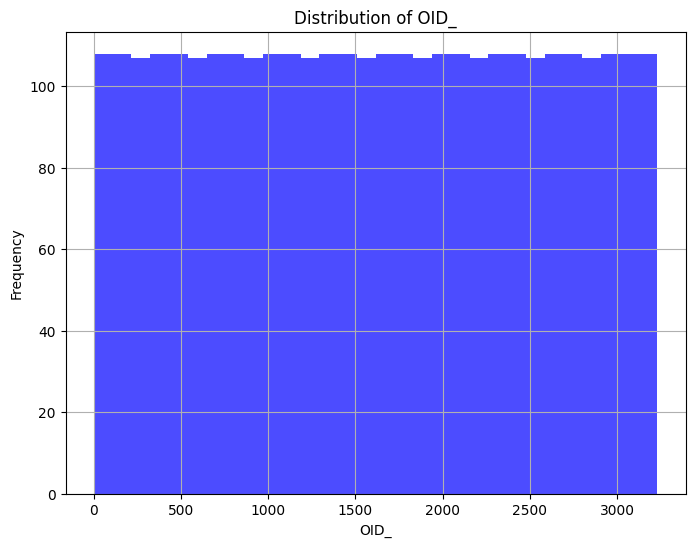

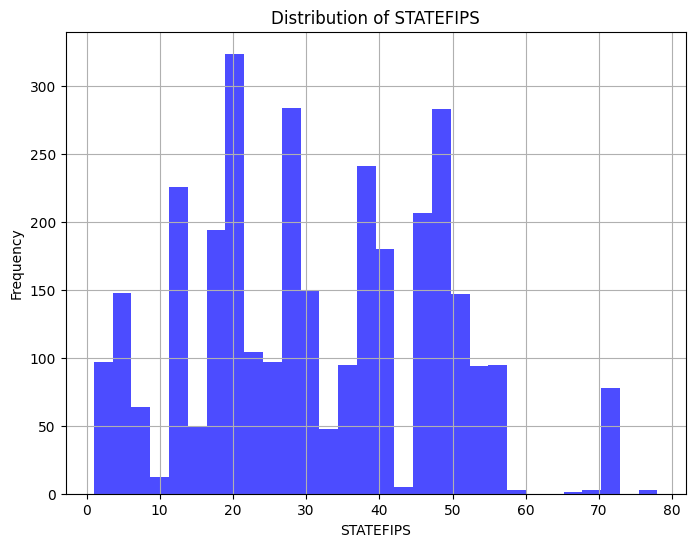

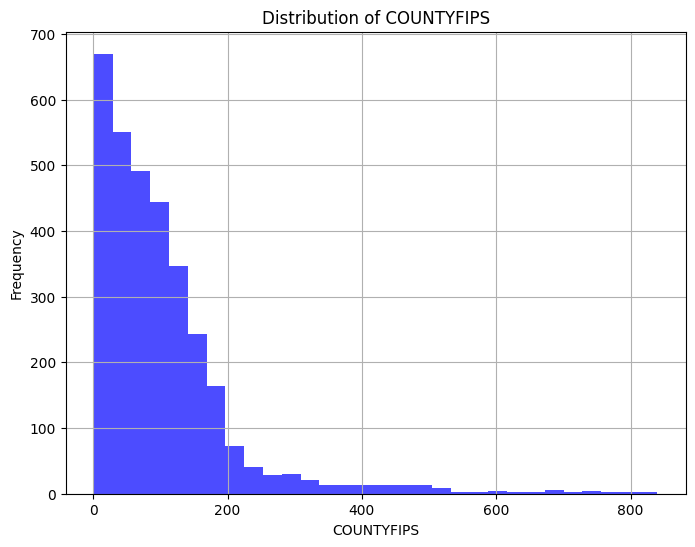

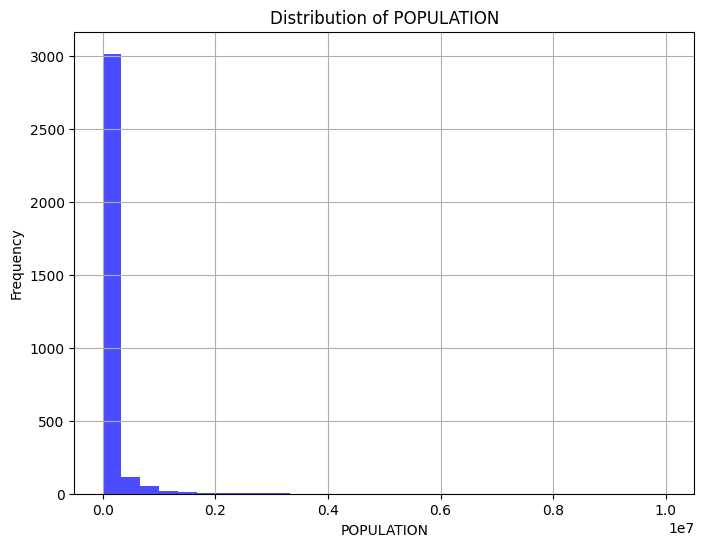

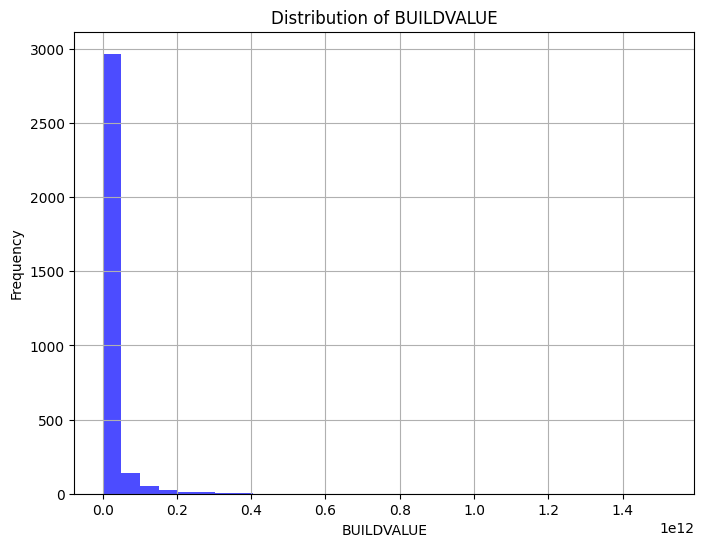

...

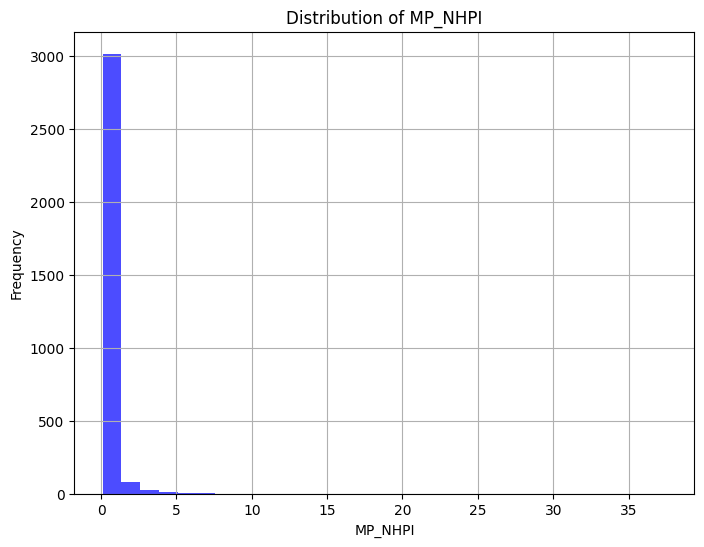

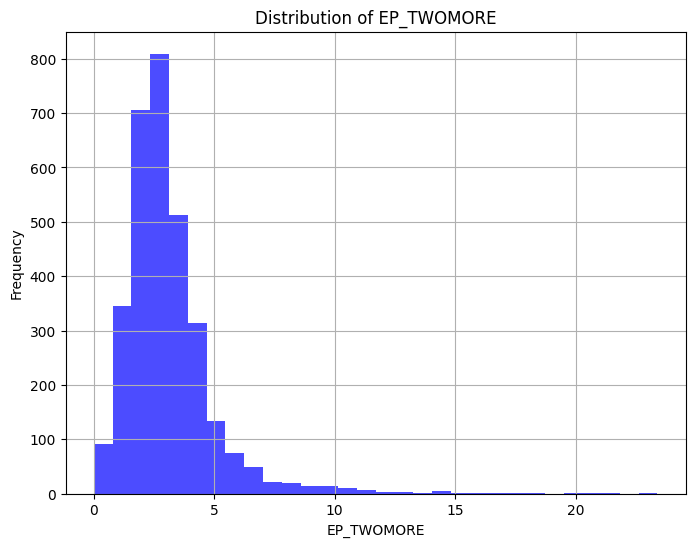

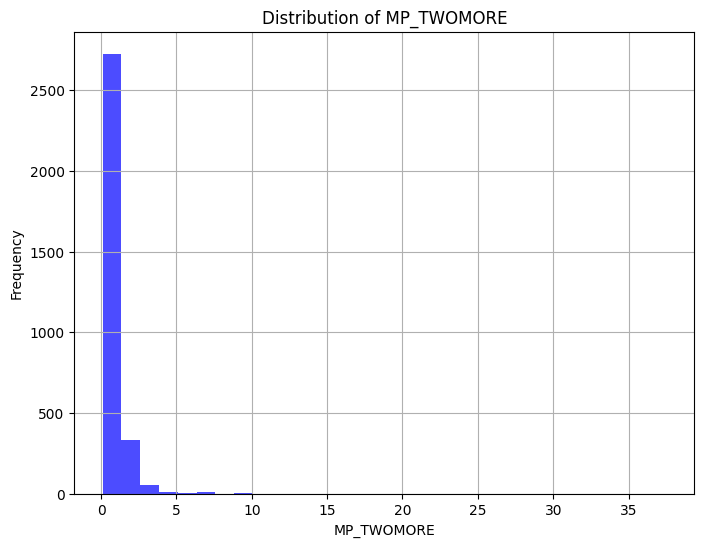

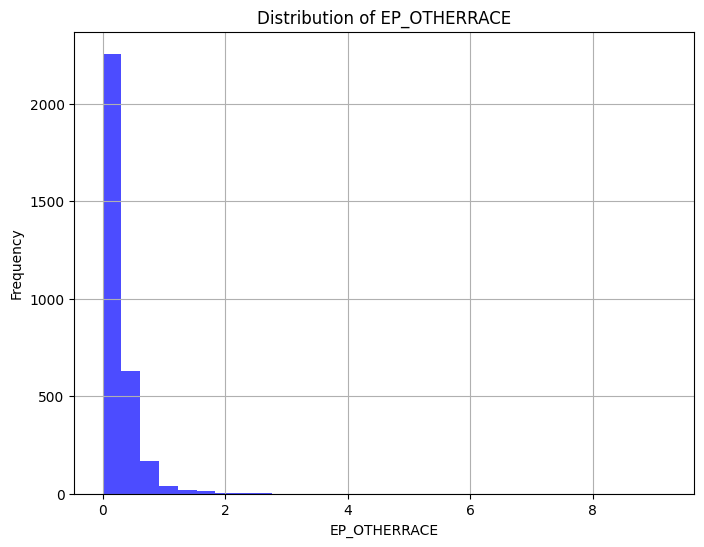

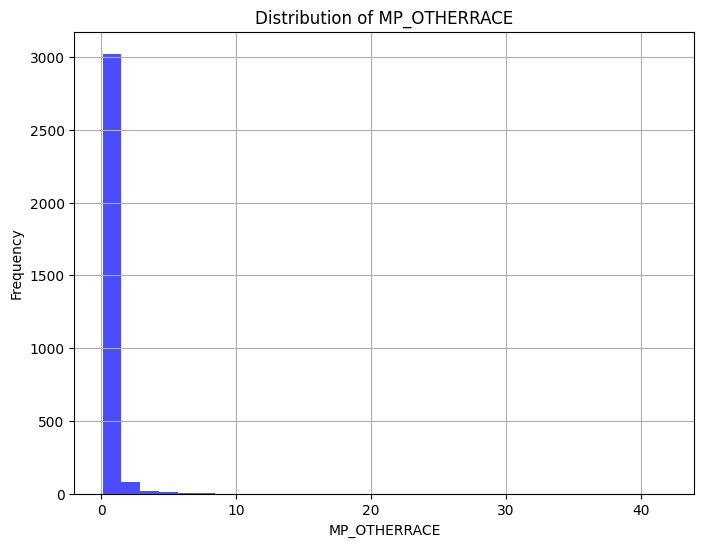

In [101]:
for col in numerical_columns:
    plot_histogram(col)